## Descriptive Analysis

In the first part of the descriptive analysis, we focus on the entire dataset, without looking at geological aspects such as census tracks or community areas. Various aspects such as travel time, number of trips, costs and weather conditions are analysed. 

In the second phase, we shift our focus to the spatial distribution of demand using hexagonal binning. We employ three distinct time windows and two different hexagon resolutions to capture variations in demand across different periods. By overlaying these hexagonal bins onto a map of Chicago, we visualize not only the demand distribution but also the geographical context of these patterns.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from h3 import h3 
import geopandas as gp
import folium
from shapely.ops import unary_union
from shapely.geometry.polygon import Polygon
import branca
import branca.colormap as cm
import matplotlib.colors as mcolors
from branca.colormap import LinearColormap
from folium.plugins import HeatMap
import branca.colormap as bcm
import pandas as pd
import folium
from h3 import h3
import collections
from IPython.display import display
import numpy as np

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
df= pd.read_parquet('data/prepped/weather_taxi_merged_df.parquet')

In [62]:
print(df.columns)

Index(['trip_id', 'taxi_id', 'trip_start_timestamp', 'trip_end_timestamp',
       'trip_seconds', 'trip_miles', 'pickup_census_tract',
       'dropoff_census_tract', 'fare', 'tips', 'tolls', 'extras', 'trip_total',
       'payment_type', 'company', 'pickup_centroid_latitude',
       'pickup_centroid_longitude', 'pickup_centroid_location',
       'dropoff_centroid_latitude', 'dropoff_centroid_longitude',
       'dropoff_centroid_location', 'trip_hours', '1_hour_window',
       '1_hour_window_sin', '1_hour_window_cos', '4_hour_window',
       '4_hour_window_sin', '4_hour_window_cos', '6_hour_window',
       '6_hour_window_sin', '6_hour_window_cos', 'weekday', 'weekday_sin',
       'weekday_cos', 'payment_type_encoded', 'company_encoded',
       'taxi_id_encoded', 'pickup_community', 'pickup_area_number',
       'dropoff_community', 'dropoff_area_number', 'h3_res7_pickup',
       'h3_res7_dropoff', 'h3_res8_pickup', 'h3_res8_dropoff', 'Date', 'Time',
       'Temperature', 'Dew Point', 'Hu

### Hourly, weekly and monthly demand summed over the entire dataset

This part of the code shows the hourly, weekly and monthly distribution of the entire dataset.

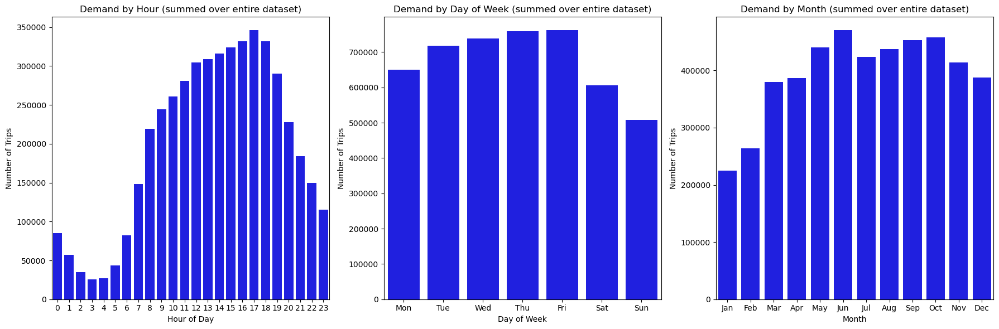

Demand by Hour Summary Statistics:
count        24.000000
mean     197486.041667
std      114497.223347
min       25558.000000
25%       84167.750000
50%      223500.000000
75%      305837.750000
max      345908.000000
Name: count, dtype: float64

Demand by Day of Week Summary Statistics:
count         7.000000
mean     677095.000000
std       94322.228623
min      508519.000000
25%      627853.000000
50%      717217.000000
75%      748407.000000
max      761409.000000
Name: count, dtype: float64

Demand by Month Summary Statistics:
count        12.000000
mean     394972.083333
std       76492.316754
min      224803.000000
25%      384935.500000
50%      418747.000000
75%      443593.000000
max      470062.000000
Name: count, dtype: float64


In [4]:
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

hour_demand = df['1_hour_window'].value_counts().sort_index()
sns.barplot(x=hour_demand.index, y=hour_demand.values, color="blue", ax=axs[0])
axs[0].set_title('Demand by Hour (summed over entire dataset)')
axs[0].set_xlabel('Hour of Day')
axs[0].set_ylabel('Number of Trips')

day_demand = df['weekday'].value_counts().sort_index()
sns.barplot(x=day_demand.index, y=day_demand.values, color="blue", ax=axs[1])
axs[1].set_title('Demand by Day of Week (summed over entire dataset)')
axs[1].set_xlabel('Day of Week')
axs[1].set_ylabel('Number of Trips')
axs[1].set_xticks(range(7))
axs[1].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])

df['month'] = df['trip_start_timestamp'].dt.month
month_demand = df['month'].value_counts().sort_index()
sns.barplot(x=month_demand.index, y=month_demand.values, color="blue", ax=axs[2])
axs[2].set_title('Demand by Month (summed over entire dataset)')
axs[2].set_xlabel('Month')
axs[2].set_ylabel('Number of Trips')
axs[2].set_xticks(range(12))
axs[2].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.tight_layout()
plt.show()

print("Demand by Hour Summary Statistics:")
print(hour_demand.describe())

print("\nDemand by Day of Week Summary Statistics:")
print(day_demand.describe())

print("\nDemand by Month Summary Statistics:")
print(month_demand.describe())


### Demand by different Seasons

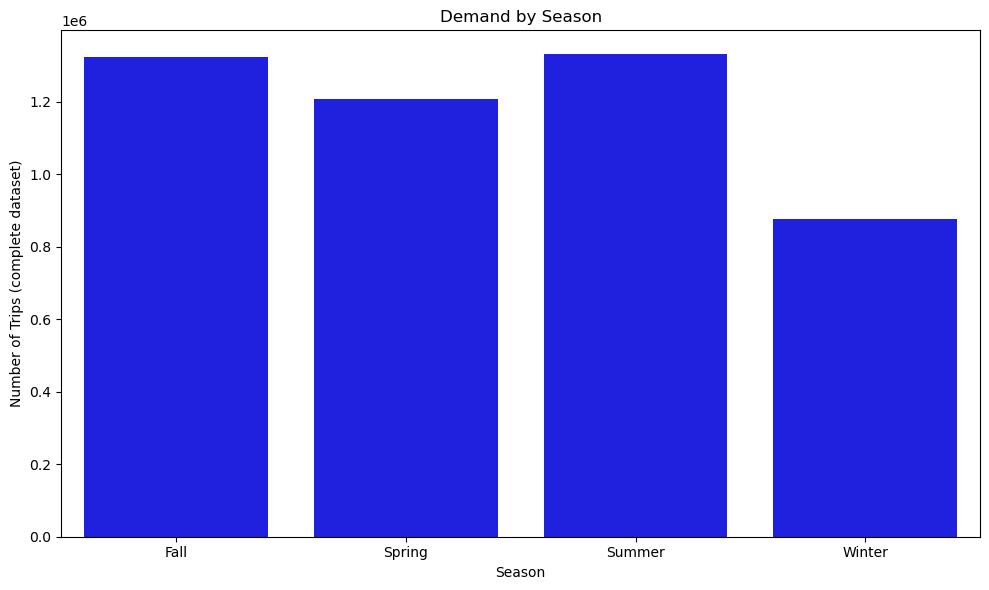

Demand by Season Summary Statistics:
count    4.000000e+00
mean     1.184916e+06
std      2.131735e+05
min      8.768080e+05
25%      1.124485e+06
50%      1.266058e+06
75%      1.326489e+06
max      1.330742e+06
Name: count, dtype: float64


In [46]:
# define seasons
def get_season(date):
    month = date.month
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

df['season'] = df['trip_start_timestamp'].apply(get_season)

season_demand = df['season'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
sns.barplot(x=season_demand.index, y=season_demand.values, color="blue")
plt.title('Demand by Season')
plt.xlabel('Season')
plt.ylabel('Number of Trips (complete dataset)')

plt.tight_layout()
plt.show()

print("Demand by Season Summary Statistics:")
print(season_demand.describe())


### Average number of taxi trips per hour by day of the week

The following heatmap shows the average number of taxi trips per hour by day of the week, for the entire taxi fleet.

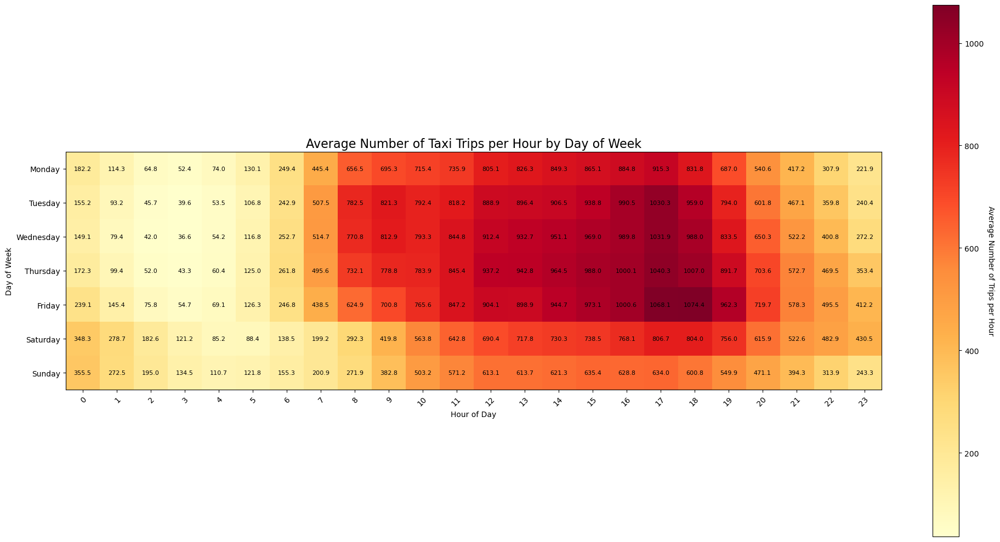

In [5]:
heatmap_data = df.pivot_table(values='trip_id', 
                              index='weekday', 
                              columns='1_hour_window', 
                              aggfunc='count')


num_weeks = df['trip_start_timestamp'].dt.to_period('W').nunique()
heatmap_data = heatmap_data / num_weeks

fig, ax = plt.subplots(figsize=(20, 10))

im = ax.imshow(heatmap_data, cmap='YlOrRd')

cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel("Average Number of Trips per Hour", rotation=-90, va="bottom")

for i in range(heatmap_data.shape[0]):
    for j in range(heatmap_data.shape[1]):
        text = ax.text(j, i, f"{heatmap_data.iloc[i, j]:.1f}",
                       ha="center", va="center", color="black", fontsize=8)

ax.set_xticks(np.arange(heatmap_data.shape[1]))
ax.set_yticks(np.arange(heatmap_data.shape[0]))
ax.set_xticklabels(heatmap_data.columns)
ax.set_yticklabels(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

ax.set_xlabel('Hour of Day')
ax.set_ylabel('Day of Week')

plt.title('Average Number of Taxi Trips per Hour by Day of Week', fontsize=16)

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

fig.tight_layout()

plt.show()

### Average trip duration minutes per hour by day of the week

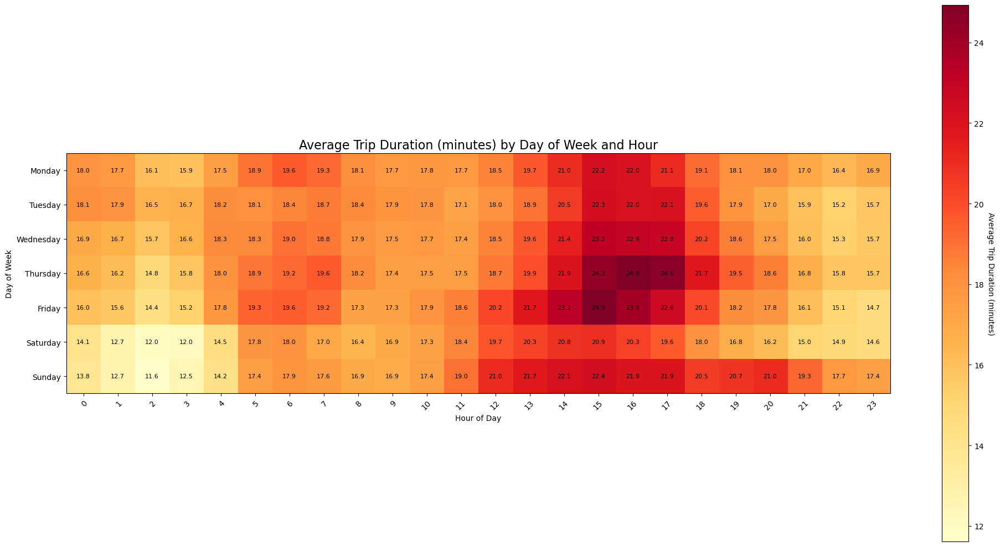

Overall Average Trip Duration: 19.25 


In [29]:
df['trip_minutes'] = df['trip_seconds'] / 60

heatmap_data = df.pivot_table(values='trip_minutes', 
                              index='weekday', 
                              columns='1_hour_window', 
                              aggfunc='mean')

fig, ax = plt.subplots(figsize=(20, 10))

im = ax.imshow(heatmap_data, cmap='YlOrRd')

cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel("Average Trip Duration (minutes)", rotation=-90, va="bottom")

for i in range(heatmap_data.shape[0]):
    for j in range(heatmap_data.shape[1]):
        text = ax.text(j, i, f"{heatmap_data.iloc[i, j]:.1f}",
                       ha="center", va="center", color="black", fontsize=8)

ax.set_xticks(np.arange(heatmap_data.shape[1]))
ax.set_yticks(np.arange(heatmap_data.shape[0]))
ax.set_xticklabels(heatmap_data.columns)
ax.set_yticklabels(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

ax.set_xlabel('Hour of Day')
ax.set_ylabel('Day of Week')

plt.title('Average Trip Duration (minutes) by Day of Week and Hour', fontsize=16)

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

fig.tight_layout()

plt.show()

overall_average_duration = df['trip_minutes'].mean()
print(f"Overall Average Trip Duration: {overall_average_duration:.2f} ")

### Average number of trips per taxi by day of the week and month

This heatmap shows the average for an individual taxi.

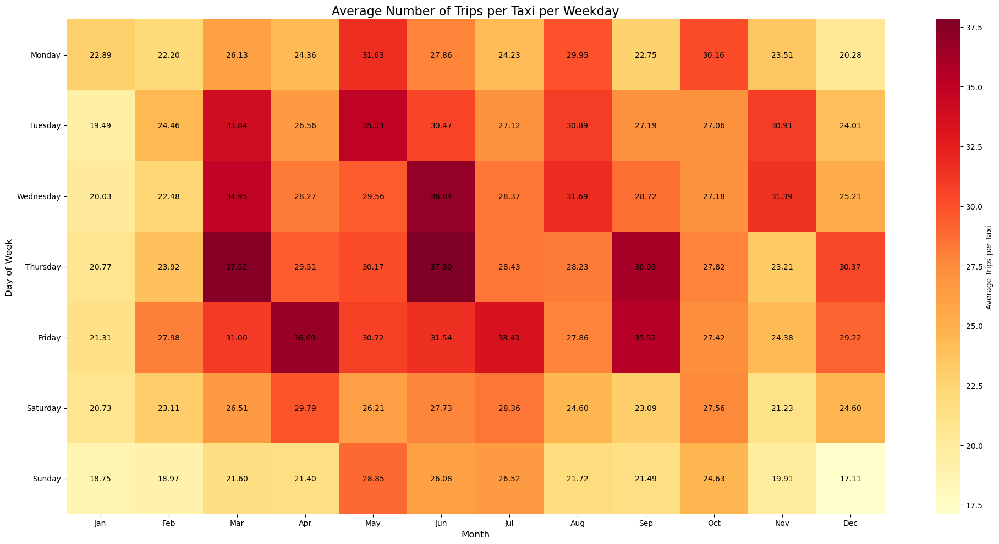

Overall average trips per taxi per day: 27.01


In [10]:
trips_per_day = df.groupby(['month', 'weekday', 'taxi_id']).size().reset_index(name='trips')
avg_trips_per_taxi = trips_per_day.groupby(['month', 'weekday'])['trips'].mean().reset_index()

heatmap_data = avg_trips_per_taxi.pivot(index='weekday', columns='month', values='trips')

fig, ax = plt.subplots(figsize=(20, 10))

sns.heatmap(heatmap_data, annot=False, fmt='.2f', cmap='YlOrRd', ax=ax,
            cbar_kws={'label': 'Average Trips per Taxi'})

for i in range(7):  
    for j in range(12):  
        if pd.notna(heatmap_data.iloc[i, j]):
            value = heatmap_data.iloc[i, j]
            ax.text(j+0.5, i+0.5, f'{value:.2f}', ha='center', va='center')
        else:
            ax.text(j+0.5, i+0.5, 'N/A', ha='center', va='center')

plt.title('Average Number of Trips per Taxi per Weekday', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Day of Week', fontsize=12)

month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(np.arange(12) + 0.5, month_names, rotation=0)

day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
plt.yticks(np.arange(7) + 0.5, day_names, rotation=0)

plt.tight_layout()
plt.show()

overall_avg = avg_trips_per_taxi['trips'].mean()

print(f"Overall average trips per taxi per day: {overall_avg:.2f}")

### Distribution of average idle times per taxi

We wanted to calculate the average idle time for each taxi and visualize the distribution of these idle times in a histogram. The code calculates idle time by measuring the gap between consecutive trips for each taxi. To focus on realistic idle times, we excluded idle times longer than 120 minutes (we choose 120 because of the average duration of a trip and the average number of trips per day per taxi), which are likely to represent breaks such as lunch or the end of a working day. We also filtered out idle times of 0 minutes to remove instances where we have idle times of 0 due to rounding issues.

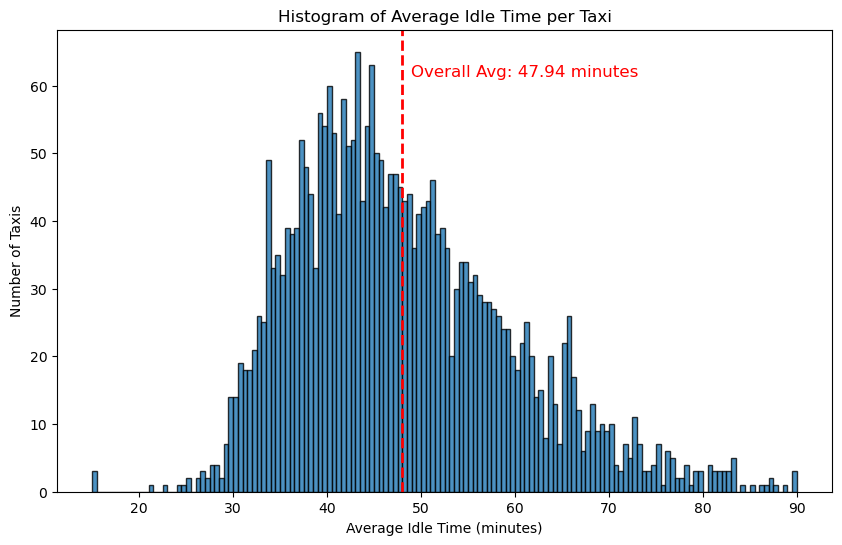

In [11]:
df = df.sort_values(by=['taxi_id', 'trip_start_timestamp'])

df['idle_time'] = df.groupby('taxi_id')['trip_start_timestamp'].diff().dt.total_seconds() / 60  # in Stunden


df_filtered = df[(df['idle_time'] > 0) & (df['idle_time'] <= 120)]


avg_idle_time_per_taxi = df_filtered.groupby('taxi_id')['idle_time'].mean()

overall_avg_idle_time = avg_idle_time_per_taxi.mean()

plt.figure(figsize=(10, 6))
n_bins = 150  
plt.hist(avg_idle_time_per_taxi.dropna(), bins=n_bins, edgecolor='black', alpha=0.8)

plt.axvline(overall_avg_idle_time, color='red', linestyle='dashed', linewidth=2)
plt.text(overall_avg_idle_time * 1.02, plt.gca().get_ylim()[1] * 0.9,  # Platzierung des Textes
         f'Overall Avg: {overall_avg_idle_time:.2f} minutes', color='red', fontsize=12)

plt.title('Histogram of Average Idle Time per Taxi')
plt.xlabel('Average Idle Time (minutes)')
plt.ylabel('Number of Taxis')
plt.show()

### Average Speed

This heatmap shows the average speed of the taxi fleet at different times for different days of the week.

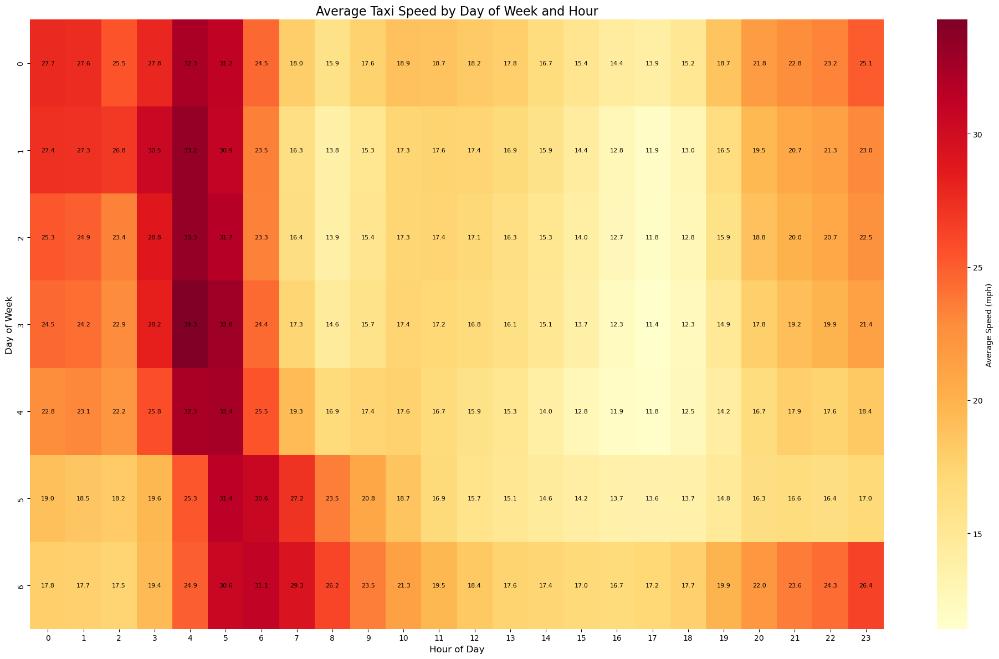

Highest average speed: 34.3 mph on Thursday at 4:00
Lowest average speed: 11.4 mph on Thursday at 17:00

Average speed by hour of day:
0:00: 23.5 mph
1:00: 23.3 mph
2:00: 22.4 mph
3:00: 25.7 mph
4:00: 30.8 mph
5:00: 31.6 mph
6:00: 26.1 mph
7:00: 20.5 mph
8:00: 17.8 mph
9:00: 18.0 mph
10:00: 18.3 mph
11:00: 17.7 mph
12:00: 17.1 mph
13:00: 16.4 mph
14:00: 15.6 mph
15:00: 14.5 mph
16:00: 13.5 mph
17:00: 13.1 mph
18:00: 13.9 mph
19:00: 16.4 mph
20:00: 19.0 mph
21:00: 20.1 mph
22:00: 20.5 mph
23:00: 22.0 mph


In [12]:
df['speed_mph'] = df['trip_miles'] / (df['trip_seconds'] / 3600)

speed_data = df.groupby(['weekday', '1_hour_window'])['speed_mph'].mean().unstack()

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

plt.figure(figsize=(20, 12))
ax = sns.heatmap(speed_data, cmap='YlOrRd', annot=False, cbar_kws={'label': 'Average Speed (mph)'})

for i in range(speed_data.shape[0]):
    for j in range(speed_data.shape[1]):
        text = ax.text(j+0.5, i+0.5, f'{speed_data.iloc[i, j]:.1f}',
                       ha="center", va="center", color="black", fontsize=8)

plt.title('Average Taxi Speed by Day of Week and Hour', fontsize=16)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Day of Week', fontsize=12)

plt.tight_layout()
plt.show()

max_speed = speed_data.max().max()
min_speed = speed_data.min().min()
max_speed_day, max_speed_hour = np.unravel_index(speed_data.values.argmax(), speed_data.shape)
min_speed_day, min_speed_hour = np.unravel_index(speed_data.values.argmin(), speed_data.shape)

print(f"Highest average speed: {max_speed:.1f} mph on {weekday_order[max_speed_day]} at {max_speed_hour}:00")
print(f"Lowest average speed: {min_speed:.1f} mph on {weekday_order[min_speed_day]} at {min_speed_hour}:00")


hourly_avg_speed = speed_data.mean()
print("\nAverage speed by hour of day:")
for hour in range(24):
    print(f"{hour}:00: {hourly_avg_speed[hour]:.1f} mph")

### Percentage of taxi fleet used by hour and day of the week

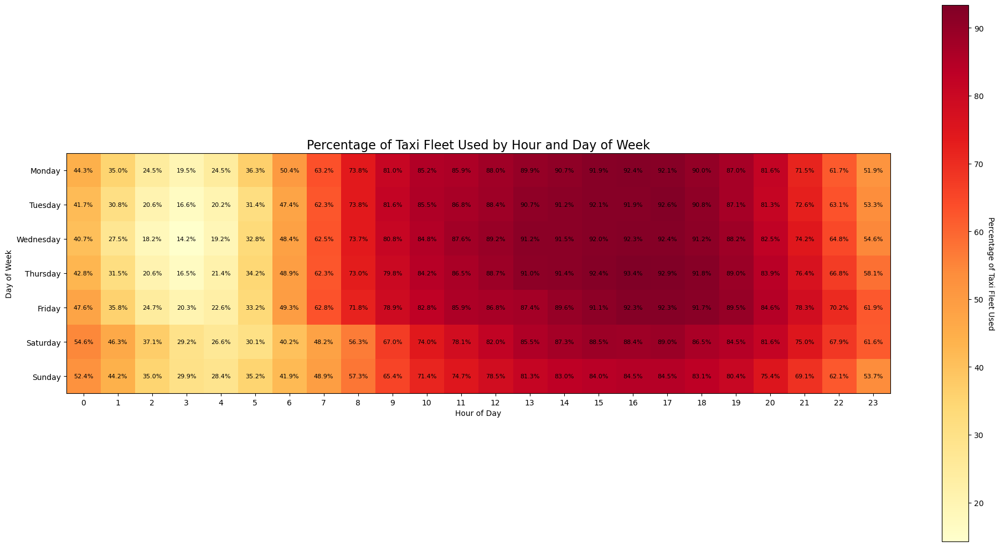

In [13]:
taxi_counts = df.groupby(['weekday', '1_hour_window'])['taxi_id'].nunique()

total_taxis = df['taxi_id'].nunique()

taxi_percentages = (taxi_counts / total_taxis * 100).unstack(level='1_hour_window')

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

fig, ax = plt.subplots(figsize=(20, 10))

im = ax.imshow(taxi_percentages, cmap='YlOrRd')

cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel("Percentage of Taxi Fleet Used", rotation=-90, va="bottom")

for i in range(len(weekday_order)):
    for j in range(24):  
        text = ax.text(j, i, f"{taxi_percentages.iloc[i, j]:.1f}%",
                       ha="center", va="center", color="black", fontsize=8)

ax.set_xticks(np.arange(24))
ax.set_yticks(np.arange(len(weekday_order)))
ax.set_xticklabels(range(24))
ax.set_yticklabels(weekday_order)

ax.set_xlabel('Hour of Day')
ax.set_ylabel('Day of Week')

plt.title('Percentage of Taxi Fleet Used by Hour and Day of Week', fontsize=16)

plt.tight_layout()

plt.show()

### Average trip total, tips and demand by hour of the day

In this graph we analyse the cost of a trip in relation to the tip. To see the demand at each price, we also plot the number of trips for every hour.

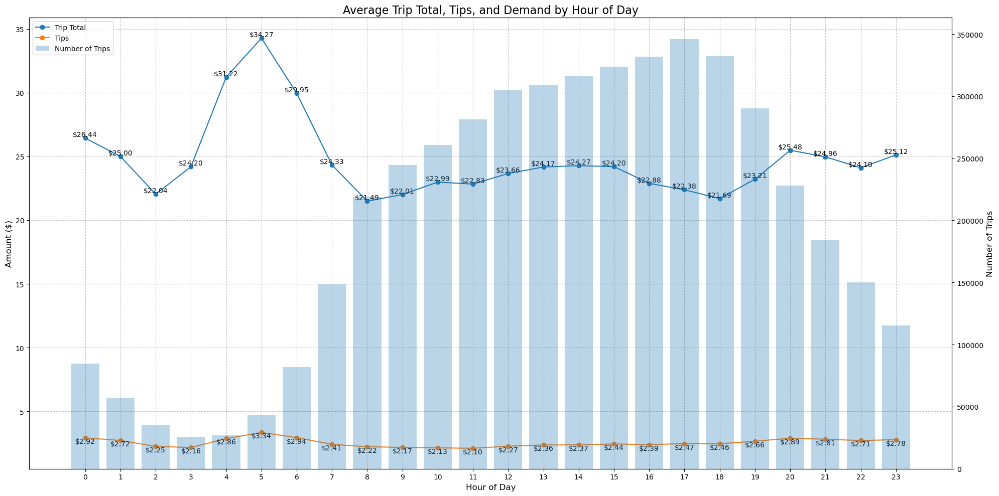

       1_hour_window  trip_total       tips      num_trips
count      24.000000   24.000000  24.000000      24.000000
mean       11.500000   24.703659   2.535648  197486.041667
std         7.071068    3.087402   0.322332  114497.223347
min         0.000000   21.487625   2.103804   25558.000000
25%         5.750000   22.870449   2.262239   84167.750000
50%        11.500000   24.182071   2.451292  223500.000000
75%        17.250000   25.025977   2.787439  305837.750000
max        23.000000   34.270021   3.341460  345908.000000

Highest average price: $34.27 at 5.0:00
Lowest average price: $21.49 at 8.0:00

Highest average tip: $3.34 at 5.0:00
Lowest average tip: $2.10 at 11.0:00

Correlation between trip total and tips: 0.81

Correlation between number of trips and trip total: -0.59
Correlation between number of trips and tips: -0.46


In [278]:
hourly_data = df.groupby('1_hour_window').agg({
    'trip_total': 'mean',
    'tips': 'mean'
}).reset_index()

hour_demand = df['1_hour_window'].value_counts().sort_index()
hourly_data['num_trips'] = hour_demand.values

fig, ax1 = plt.subplots(figsize=(20, 10))

ax1.plot(hourly_data['1_hour_window'], hourly_data['trip_total'], marker='o', label='Trip Total')
ax1.plot(hourly_data['1_hour_window'], hourly_data['tips'], marker='o', label='Tips')
ax1.set_xlabel('Hour of Day', fontsize=12)
ax1.set_ylabel('Amount ($)', fontsize=12)
ax1.tick_params(axis='y')

ax2 = ax1.twinx()
ax2.bar(hourly_data['1_hour_window'], hourly_data['num_trips'], alpha=0.3, label='Number of Trips')
ax2.set_ylabel('Number of Trips', fontsize=12)
ax2.tick_params(axis='y')

plt.title('Average Trip Total, Tips, and Demand by Hour of Day', fontsize=16)
ax1.set_xticks(range(0, 24))
ax1.grid(True, linestyle='--', alpha=0.7)

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

for i, row in hourly_data.iterrows():
    ax1.text(row['1_hour_window'], row['trip_total'], f'${row["trip_total"]:.2f}', 
             ha='center', va='bottom', fontsize=10, color='black')
    ax1.text(row['1_hour_window'], row['tips'], f'${row["tips"]:.2f}', 
             ha='center', va='top', fontsize=10, color='black')

plt.tight_layout()
plt.show()

print(hourly_data.describe())
max_price_hour = hourly_data.loc[hourly_data['trip_total'].idxmax()]
min_price_hour = hourly_data.loc[hourly_data['trip_total'].idxmin()]
print(f"\nHighest average price: ${max_price_hour['trip_total']:.2f} at {max_price_hour['1_hour_window']}:00")
print(f"Lowest average price: ${min_price_hour['trip_total']:.2f} at {min_price_hour['1_hour_window']}:00")
max_tip_hour = hourly_data.loc[hourly_data['tips'].idxmax()]
min_tip_hour = hourly_data.loc[hourly_data['tips'].idxmin()]
print(f"\nHighest average tip: ${max_tip_hour['tips']:.2f} at {max_tip_hour['1_hour_window']}:00")
print(f"Lowest average tip: ${min_tip_hour['tips']:.2f} at {min_tip_hour['1_hour_window']}:00")
correlation = hourly_data['trip_total'].corr(hourly_data['tips'])
print(f"\nCorrelation between trip total and tips: {correlation:.2f}")

corr_trips_total = hourly_data['num_trips'].corr(hourly_data['trip_total'])
corr_trips_tips = hourly_data['num_trips'].corr(hourly_data['tips'])
print(f"\nCorrelation between number of trips and trip total: {corr_trips_total:.2f}")
print(f"Correlation between number of trips and tips: {corr_trips_tips:.2f}")

### Correlation trip seconds, trip miles and fare

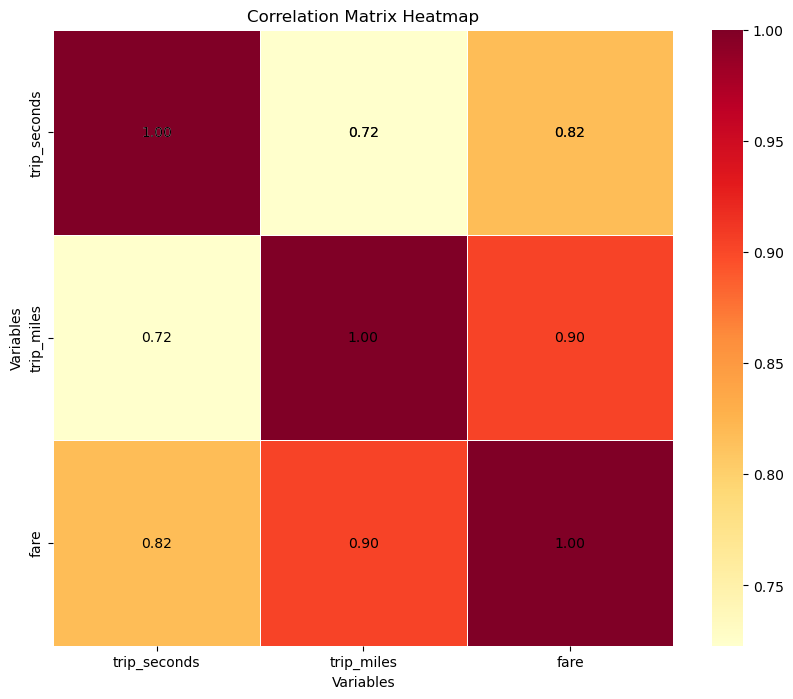

In [294]:
selected_columns = ['trip_seconds','trip_miles', 'fare']
df_selected = df[selected_columns]

correlation_matrix = df_selected.corr()

plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="YlOrRd", linewidths=0.5, cbar=True)

plt.title('Correlation Matrix Heatmap')
plt.xlabel('Variables')
plt.ylabel('Variables')

for i in range(len(correlation_matrix)):
    for j in range(len(correlation_matrix)):
        plt.text(j + 0.5, i + 0.5, f'{correlation_matrix.iloc[i, j]:.2f}',
                 ha='center', va='center', color='black')

plt.show()

### Weather

In this part of the notebook we analyze the demand in relation to the weather. We start with analyzing the temperature in relation to the demand.

In [27]:
# Convert Temperature from Fahrenheit to Celsius for better interpretation
df['Temperature_C'] = (df['Temperature'] - 32) * 5.0/9.0

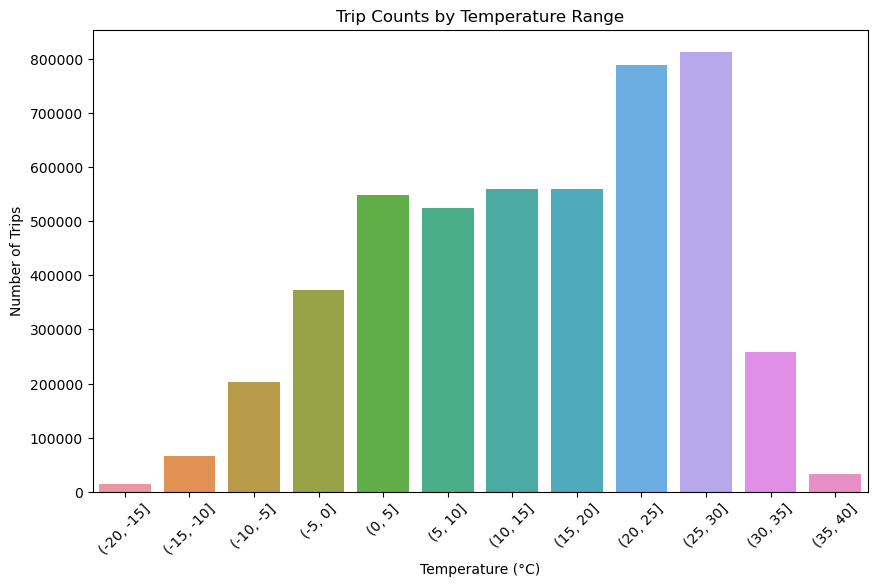

Temperature Statistics by Bin:
      Temp_bin  trip_count  mean_temp  median_temp  std_temp
0   (-20, -15]       15253 -16.409850   -16.666667  0.785745
1   (-15, -10]       65932 -11.457133   -11.111111  1.325847
2    (-10, -5]      202050  -6.726666    -6.666667  1.367630
3      (-5, 0]      372534  -2.106179    -2.222222  1.507376
4       (0, 5]      547884   2.896813     2.777778  1.395103
5      (5, 10]      525052   7.533043     7.222222  1.493316
6     (10, 15]      559464  12.659343    12.777778  1.463630
7     (15, 20]      560164  17.619558    17.777778  1.416414
8     (20, 25]      788313  22.959378    22.777778  1.413751
9     (25, 30]      812803  27.628712    27.222222  1.409065
10    (30, 35]      257590  31.965492    31.666667  1.258060
11    (35, 40]       32626  36.696755    36.666667  0.837924


In [33]:
df['Temp_bin'] = pd.cut(df['Temperature_C'], bins=range(-20, 45, 5))

temp_demand = df.groupby('Temp_bin')['trip_id'].count().reset_index()

temp_stats = df.groupby('Temp_bin').agg(
    trip_count=('trip_id', 'count'),
    mean_temp=('Temperature_C', 'mean'),
    median_temp=('Temperature_C', 'median'),
    std_temp=('Temperature_C', 'std')
).reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(data=temp_demand, x='Temp_bin', y='trip_id')
plt.xticks(rotation=45)
plt.title('Trip Counts by Temperature Range')
plt.xlabel('Temperature (°C)')
plt.ylabel('Number of Trips')
plt.show()

print("Temperature Statistics by Bin:")
print(temp_stats)

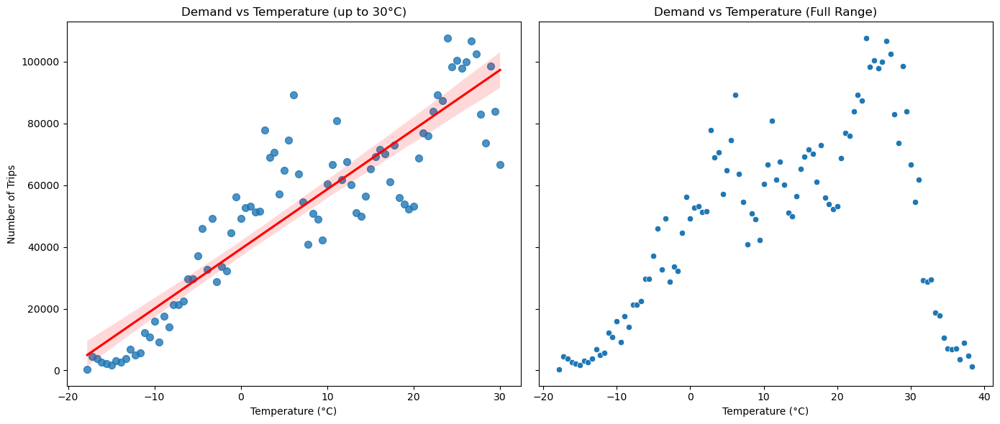

In [31]:
temp_demand = df.groupby('Temperature_C')['trip_id'].count().reset_index(name='trip_count')

# Split the data into two parts: up to 30°C and all data
temp_demand_below_30 = temp_demand[temp_demand['Temperature_C'] <= 30]
temp_demand_all = temp_demand

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

sns.regplot(data=temp_demand_below_30, x='Temperature_C', y='trip_count', scatter_kws={'s':50}, line_kws={"color":"red"}, ax=axes[0])
axes[0].set_title('Demand vs Temperature (up to 30°C)')
axes[0].set_xlabel('Temperature (°C)')
axes[0].set_ylabel('Number of Trips')

sns.scatterplot(data=temp_demand_all, x='Temperature_C', y='trip_count', ax=axes[1])
axes[1].set_title('Demand vs Temperature (Full Range)')
axes[1].set_xlabel('Temperature (°C)')

plt.tight_layout()
plt.show()

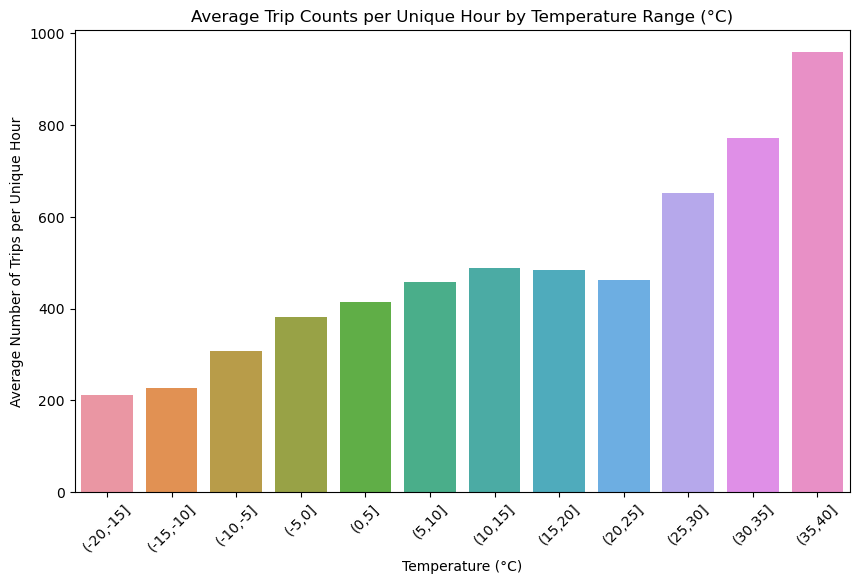

Temperature Analysis (including average trips per unique hour):
     Temp_bin  trip_count  unique_hours_in_bin  trips_per_unique_hour
0   (-20,-15]       15253                   72             211.847222
1   (-15,-10]       65932                  292             225.794521
2    (-10,-5]      202050                  658             307.066869
3      (-5,0]      372534                  978             380.914110
4       (0,5]      547884                 1326             413.185520
5      (5,10]      525052                 1145             458.560699
6     (10,15]      559464                 1147             487.762860
7     (15,20]      560164                 1159             483.316652
8     (20,25]      788313                 1709             461.271504
9     (25,30]      812803                 1246             652.329856
10    (30,35]      257590                  334             771.227545
11    (35,40]       32626                   34             959.588235


In [84]:
# Step 3: Count the number of unique (date, hour) combinations in each temperature bin
df['date_hour'] = df['trip_start_timestamp'].dt.floor('H')  # This creates a datetime column rounded to the nearest hour
unique_hours_in_bin = df.groupby('Temp_bin')['date_hour'].nunique().reset_index(name='unique_hours_in_bin')

# Step 4: Count the number of trips in each temperature bin
trip_count = df.groupby('Temp_bin')['trip_id'].count().reset_index(name='trip_count')

# Step 5: Merge the dataframes to combine the trip counts with the number of unique hours
temp_analysis = pd.merge(trip_count, unique_hours_in_bin, on='Temp_bin')

# Step 6: Calculate the average number of trips per unique hour in each temperature bin
temp_analysis['trips_per_unique_hour'] = temp_analysis['trip_count'] / temp_analysis['unique_hours_in_bin']

# Plotting the results
plt.figure(figsize=(10, 6))
sns.barplot(data=temp_analysis, x='Temp_bin', y='trips_per_unique_hour')
plt.xticks(rotation=45)
plt.title('Average Trip Counts per Unique Hour by Temperature Range (°C)')
plt.xlabel('Temperature (°C)')
plt.ylabel('Average Number of Trips per Unique Hour')
plt.show()

# Displaying the detailed analysis
print("Temperature Analysis (including average trips per unique hour):")
print(temp_analysis)

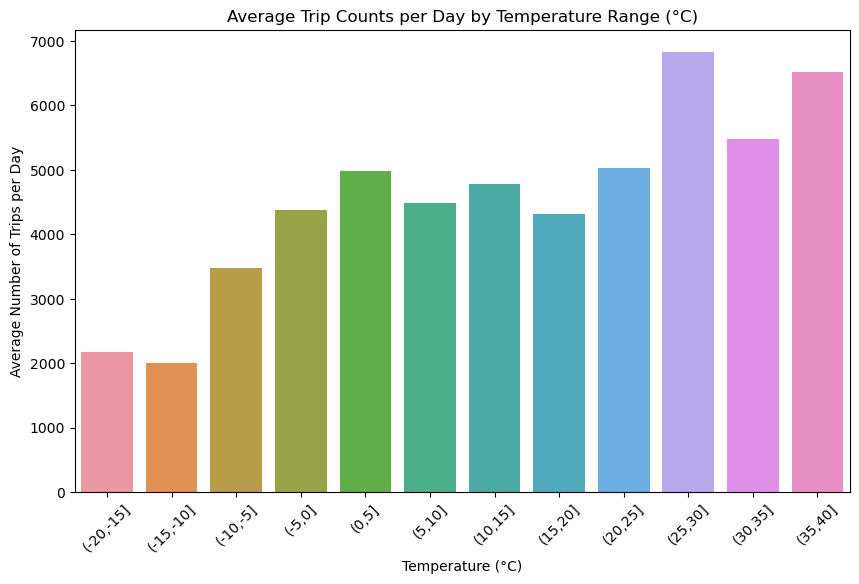

Temperature Analysis (including average trips per day):
     Temp_bin  trip_count  days_in_bin  trips_per_day
0   (-20,-15]       15253            7    2179.000000
1   (-15,-10]       65932           33    1997.939394
2    (-10,-5]      202050           58    3483.620690
3      (-5,0]      372534           85    4382.752941
4       (0,5]      547884          110    4980.763636
5      (5,10]      525052          117    4487.623932
6     (10,15]      559464          117    4781.743590
7     (15,20]      560164          130    4308.953846
8     (20,25]      788313          157    5021.101911
9     (25,30]      812803          119    6830.277311
10    (30,35]      257590           47    5480.638298
11    (35,40]       32626            5    6525.200000


In [78]:
# Counting the number of unique days in each temperature bin
df['date'] = df['trip_start_timestamp'].dt.date
temp_occurrences = df.groupby('Temp_bin')['date'].nunique().reset_index(name='days_in_bin')

# Counting the number of trips in each temperature bin
temp_demand = df.groupby('Temp_bin')['trip_id'].count().reset_index(name='trip_count')

temp_analysis = pd.merge(temp_demand, temp_occurrences, on='Temp_bin')

# Calculating the average number of trips per day in each temperature bin
temp_analysis['trips_per_day'] = temp_analysis['trip_count'] / temp_analysis['days_in_bin']

plt.figure(figsize=(10, 6))
sns.barplot(data=temp_analysis, x='Temp_bin', y='trips_per_day')
plt.xticks(rotation=45)
plt.title('Average Trip Counts per Day by Temperature Range (°C)')
plt.xlabel('Temperature (°C)')
plt.ylabel('Average Number of Trips per Day')
plt.show()

print("Temperature Analysis (including average trips per day):")
print(temp_analysis)

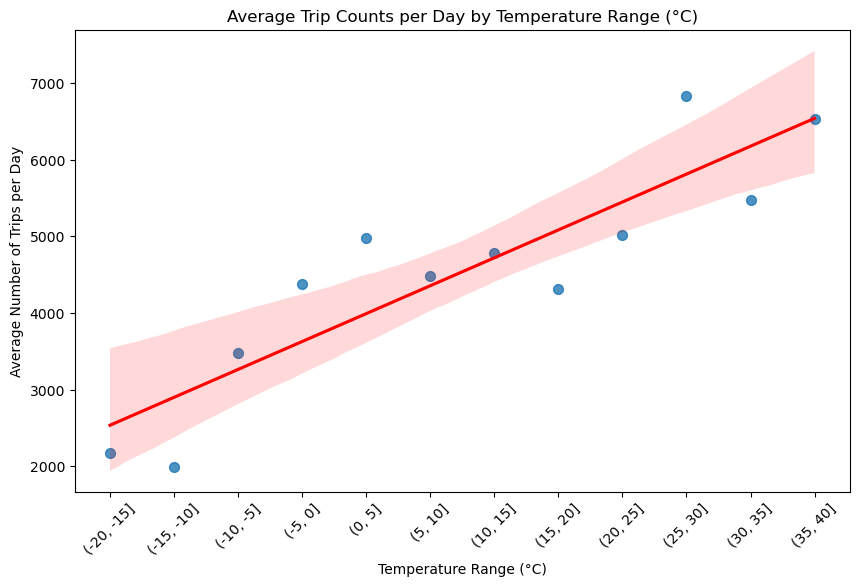

In [70]:
plt.figure(figsize=(10, 6))
sns.regplot(data=temp_analysis, x=temp_analysis['Temp_bin'].cat.codes, y='trips_per_day', scatter_kws={'s':50}, line_kws={"color":"red"})
plt.xticks(ticks=range(len(temp_analysis['Temp_bin'].unique())), labels=temp_analysis['Temp_bin'].unique(), rotation=45)
plt.title('Average Trip Counts per Day by Temperature Range (°C)')
plt.xlabel('Temperature Range (°C)')
plt.ylabel('Average Number of Trips per Day')
plt.show()

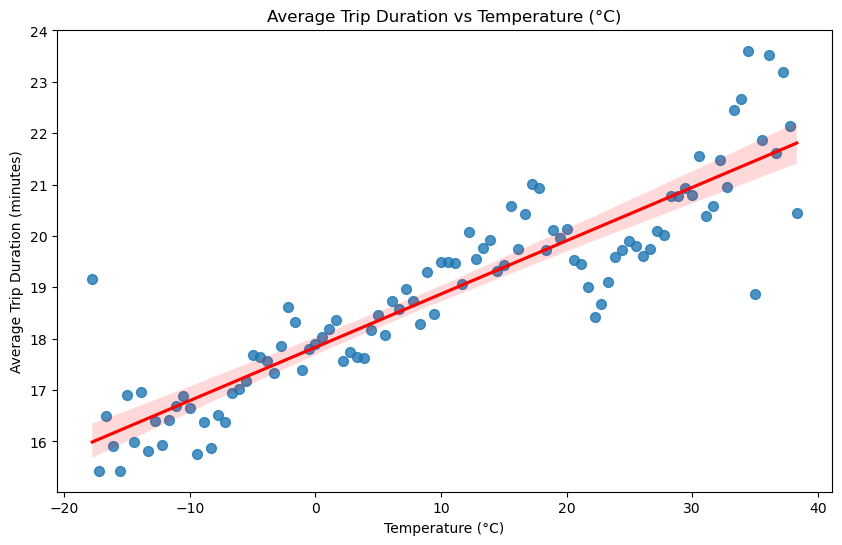

The correlation between temperature and average journey time is: 0.90


In [67]:
temp_duration = df.groupby('Temperature_C')['trip_minutes'].mean().reset_index(name='avg_trip_duration')

plt.figure(figsize=(10, 6))
sns.regplot(data=temp_duration, x='Temperature_C', y='avg_trip_duration', scatter_kws={'s':50}, line_kws={"color":"red"})
plt.title('Average Trip Duration vs Temperature (°C)')
plt.xlabel('Temperature (°C)')
plt.ylabel('Average Trip Duration (minutes)')
plt.show()


# average trip duration for every temperature 
temp_duration = df.groupby('Temperature_C')['trip_duration'].mean().reset_index(name='avg_trip_duration')

correlation = temp_duration['Temperature_C'].corr(temp_duration['avg_trip_duration'])

print(f"The correlation between temperature and average journey time is: {correlation:.2f}")

Now, we analyze the demand in relation to the different weather conditions.

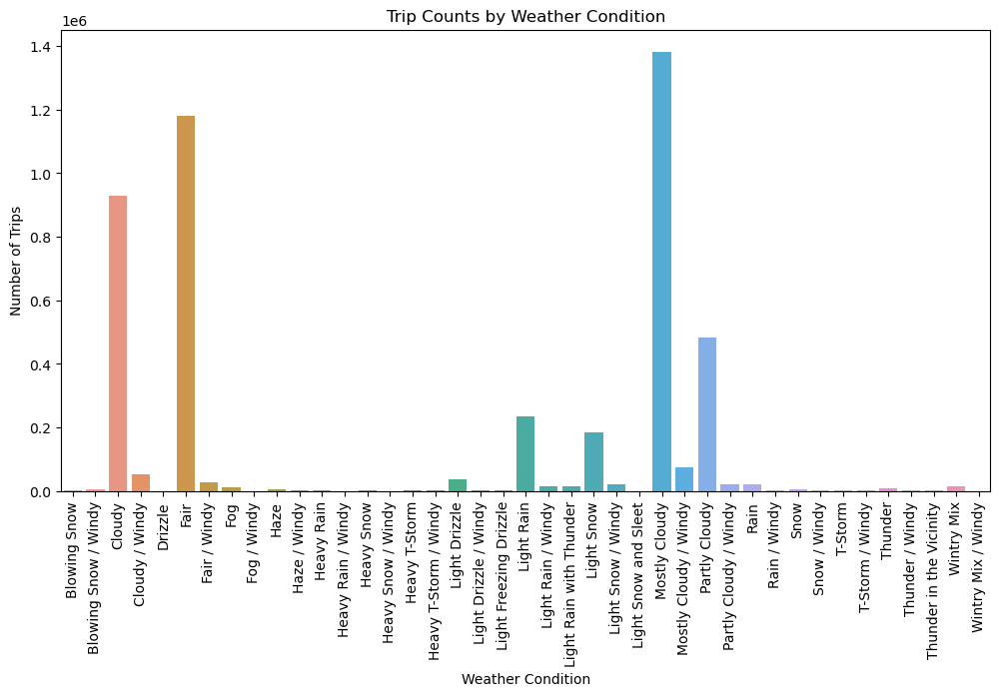

In [43]:
# Aggregating trip counts by weather condition
trip_counts = df.groupby('Condition')['trip_id'].count().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(data=trip_counts, x='Condition', y='trip_id')
plt.xticks(rotation=90)
plt.title('Trip Counts by Weather Condition')
plt.xlabel('Weather Condition')
plt.ylabel('Number of Trips')
plt.show()

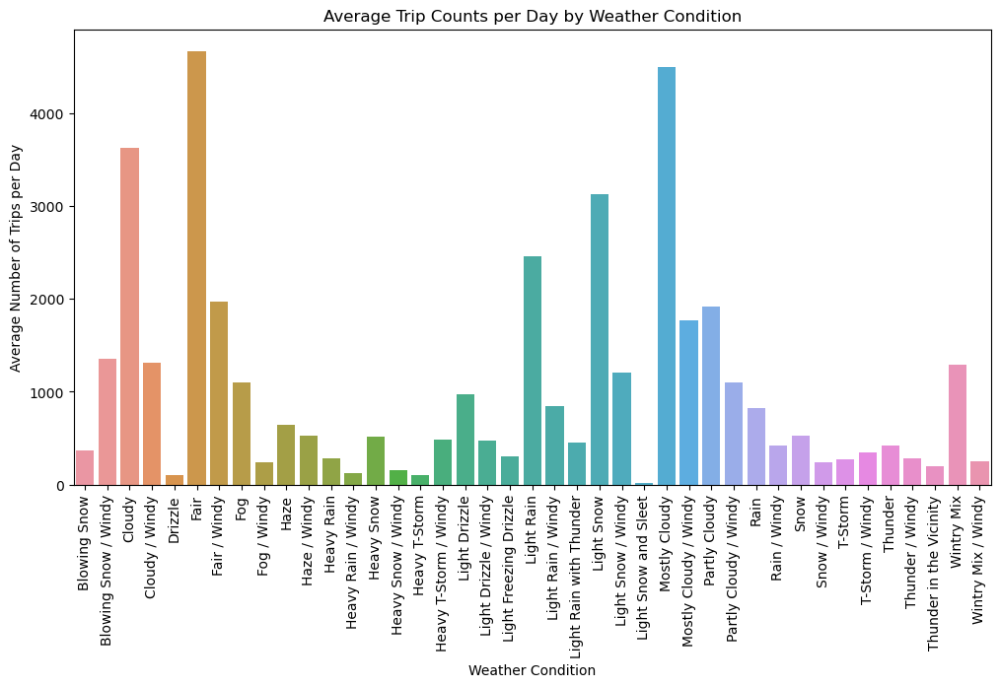

Weather Condition Analysis (including average trips per day):
                  Condition  trip_count  days_in_condition  trips_per_day
0              Blowing Snow        1088                  3     362.666667
1      Blowing Snow / Windy        5396                  4    1349.000000
2                    Cloudy      928899                256    3628.511719
3            Cloudy / Windy       51199                 39    1312.794872
4                   Drizzle         198                  2      99.000000
5                      Fair     1181139                253    4668.533597
6              Fair / Windy       27541                 14    1967.214286
7                       Fog       12129                 11    1102.636364
8               Fog / Windy         240                  1     240.000000
9                      Haze        3886                  6     647.666667
10             Haze / Windy         527                  1     527.000000
11               Heavy Rain        2828           

In [44]:
# Count the number of unique days each weather condition occurred
condition_occurrences = df.groupby('Condition')['date'].nunique().reset_index(name='days_in_condition')

# Count the total number of trips for each weather condition
trip_counts = df.groupby('Condition')['trip_id'].count().reset_index(name='trip_count')

# Merge the two DataFrames
condition_analysis = pd.merge(trip_counts, condition_occurrences, on='Condition')

# Calculate the average number of trips per day for each weather condition
condition_analysis['trips_per_day'] = condition_analysis['trip_count'] / condition_analysis['days_in_condition']

plt.figure(figsize=(12, 6))
sns.barplot(data=condition_analysis, x='Condition', y='trips_per_day')
plt.xticks(rotation=90)
plt.title('Average Trip Counts per Day by Weather Condition')
plt.xlabel('Weather Condition')
plt.ylabel('Average Number of Trips per Day')
plt.show()

print("Weather Condition Analysis (including average trips per day):")
print(condition_analysis)

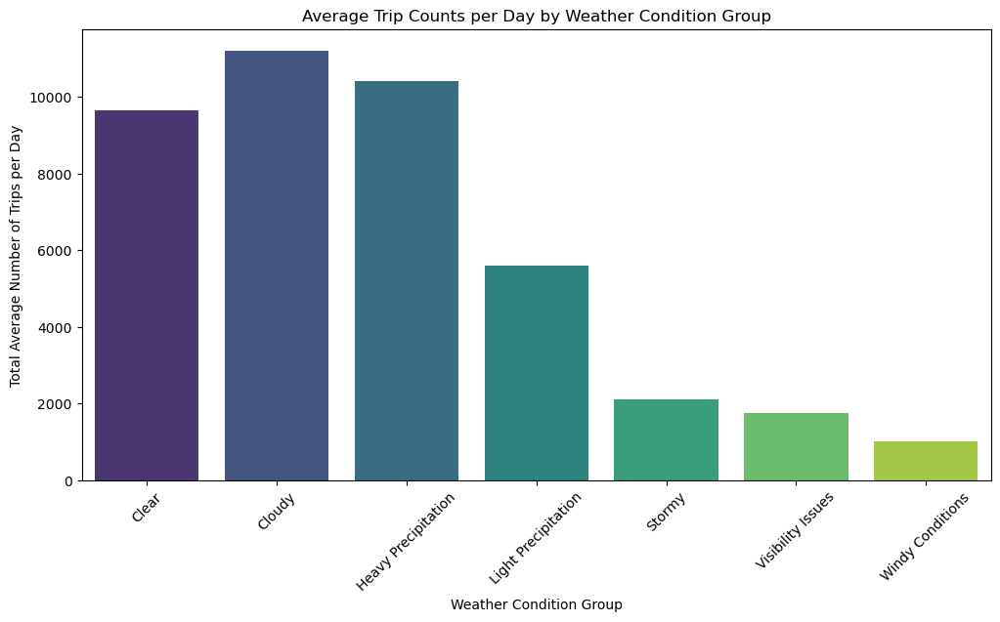

Weather Condition Group Analysis (including total average trips per day):
       Condition_Group  trips_per_day
0                Clear    9647.870898
1               Cloudy   11204.102362
2  Heavy Precipitation   10423.429009
3  Light Precipitation    5601.231397
4               Stormy    2103.491558
5    Visibility Issues    1750.303030
6     Windy Conditions    1009.500000


In [74]:
def categorize_condition(condition):
    if condition in ['Fair', 'Fair / Windy', 'Partly Cloudy', 'Partly Cloudy / Windy']:
        return 'Clear'
    elif condition in ['Cloudy', 'Cloudy / Windy', 'Mostly Cloudy', 'Mostly Cloudy / Windy']:
        return 'Cloudy'
    elif condition in ['Light Rain', 'Light Rain / Windy', 'Light Drizzle', 'Light Drizzle / Windy', 'Drizzle', 'Light Freezing Drizzle', 'Light Rain with Thunder']:
        return 'Light Precipitation'
    elif condition in ['Rain', 'Rain / Windy', 'Heavy Rain', 'Heavy Rain / Windy', 'Snow', 'Heavy Snow', 'Heavy Snow / Windy', 'Light Snow', 'Light Snow / Windy', 'Light Snow and Sleet', 'Wintry Mix', 'Wintry Mix / Windy', 'Blowing Snow', 'Blowing Snow / Windy']:
        return 'Heavy Precipitation'
    elif condition in ['T-Storm', 'T-Storm / Windy', 'Heavy T-Storm', 'Heavy T-Storm / Windy', 'Thunder', 'Thunder / Windy', 'Thunder in the Vicinity']:
        return 'Stormy'
    elif 'Windy' in condition:
        return 'Windy Conditions'
    elif condition in ['Fog', 'Fog / Windy', 'Haze', 'Haze / Windy']:
        return 'Visibility Issues'
    else:
        return 'Other'

condition_analysis['Condition_Group'] = condition_analysis['Condition'].apply(categorize_condition)

grouped_condition_analysis = condition_analysis.groupby('Condition_Group')['trips_per_day'].sum().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(data=grouped_condition_analysis, x='Condition_Group', y='trips_per_day', palette='viridis')
plt.xticks(rotation=45)
plt.title('Average Trip Counts per Day by Weather Condition Group')
plt.xlabel('Weather Condition Group')
plt.ylabel('Total Average Number of Trips per Day')
plt.show()

print("Weather Condition Group Analysis (including total average trips per day):")
print(grouped_condition_analysis)

### Hexagons

In this section of the notebook, we analyze the demand across the entire dataset using hexagonal binning. We choose resolutions 7 and 8 because they provide the most suitable level of detail for our analysis. The maps are divided into pickup and dropoff locations.

The analysis is conducted across four different time windows: a full 24-hour period, a 4-hour time window, and a 6-hour time window. This allows us to capture variations in demand throughout the day.

The first hexagon map shows the raw distribution of trips. Due to the highly unequal distribution, we use a logarithmic scale for the subsequent hexagon maps. The values within each hexagon represent the number of trips, rounded to the nearest thousand. The color scheme ranges from black, indicating the minimum number of trips, to bright red, indicating the maximum.

#### Map without log scaling and 24-hour period

In [281]:
def create_mapWithoutLog(hexagon_counts, resolution, map_title):
    m = folium.Map(location=[41.8781, -87.6298], zoom_start=10)  
    
    counts = np.array(list(hexagon_counts.values()))
    
    min_count, max_count = counts.min(), counts.max()
    
    thresholds = np.linspace(min_count, max_count, 5)
    colors = ['#000000', '#400000', '#800000', '#ff0000']
    labels = [f'{int(thresholds[i])} - {int(thresholds[i + 1])}' for i in range(len(thresholds) - 1)]
    
    for hex_id, count in hexagon_counts.items():
        boundaries = h3.h3_to_geo_boundary(hex_id)
        
        normalized_count = (count - min_count) / (max_count - min_count)  
        color = f'#{int(255 * normalized_count):02x}0000'  
        
        folium.Polygon(
            locations=boundaries,
            color=color,
            fill=True,
            fillColor=color,
            fillOpacity=0.7,
            tooltip=f'Hexagon ID: {hex_id}, Count: {count}'
        ).add_to(m)
    
    colormap = branca.colormap.StepColormap(
        colors=colors,
        vmin=min_count,
        vmax=max_count,
        index=thresholds,
        caption='Number of Trips'
    )
    
    colormap.add_to(m)
    
    return m

In [282]:
def create_maps_for_full_dataset_without_log(df):
    
    pickup_7 = collections.Counter(df['h3_res7_pickup'])
    dropoff_7 = collections.Counter(df['h3_res7_dropoff'])
    
    print("Pickup Map (Resolution 7)")
    display(create_mapWithoutLog(pickup_7, 7, 'pickup'))

    print("\nDropoff Map (Resolution 7)")
    display(create_mapWithoutLog(dropoff_7, 7, 'dropoff'))

In [283]:
create_maps_for_full_dataset_without_log(df)

Pickup Map (Resolution 7)



Dropoff Map (Resolution 7)


#### Map with log scaling

In [58]:
def create_map(hexagon_counts, resolution, map_title):
    m = folium.Map(location=[41.8781, -87.6298], zoom_start=10)  # Chicago-Koordinaten
    
    counts = np.array(list(hexagon_counts.values()))
    min_count, max_count = np.log1p(counts.min()), np.log1p(counts.max())
    
    for hex_id, count in hexagon_counts.items():
        boundaries = h3.h3_to_geo_boundary(hex_id)
        center = h3.h3_to_geo(hex_id)
        
        log_count = np.log1p(count)
        normalized_count = (log_count - min_count) / (max_count - min_count)
        color = f'#{int(255 * normalized_count):02x}0000'
        
        folium.Polygon(
            locations=boundaries,
            color=color,
            fill=True,
            fillColor=color,
            fillOpacity=0.7,
            tooltip=f'Hexagon ID: {hex_id}, Count: {count}'  # Tooltip hinzufügen
        ).add_to(m)
        
        rounded_count = round(count / 1000)
        folium.Marker(
            location=center,
            icon=folium.DivIcon(html=f'<div style="font-size: 5pt; color: black">{rounded_count}k</div>')
        ).add_to(m)
    
    return m

In [59]:
def create_maps_for_full_dataset(df):
    # Zählen Sie die Häufigkeit der Hexagons
    pickup_7 = collections.Counter(df['h3_res7_pickup'])
    dropoff_7 = collections.Counter(df['h3_res7_dropoff'])
    pickup_8 = collections.Counter(df['h3_res8_pickup'])
    dropoff_8 = collections.Counter(df['h3_res8_dropoff'])
    
    # Erstellen und Anzeigen der Karten
    print("Pickup Map (Resolution 7)")
    display(create_map(pickup_7, 7, 'pickup'))

    print("\nDropoff Map (Resolution 7)")
    display(create_map(dropoff_7, 7, 'dropoff'))

    print("\nPickup Map (Resolution 8)")
    display(create_map(pickup_8, 8, 'pickup'))

    print("\nDropoff Map (Resolution 8)")
    display(create_map(dropoff_8, 8, 'dropoff'))

In [60]:
def create_maps_for_time_windows(df, time_window_col):
    for window in df[time_window_col].unique():
        df_window = df[df[time_window_col] == window]
        
        # Zählen Sie die Häufigkeit der Hexagons für das aktuelle Zeitfenster
        pickup_7 = collections.Counter(df_window['h3_res7_pickup'])
        dropoff_7 = collections.Counter(df_window['h3_res7_dropoff'])
        pickup_8 = collections.Counter(df_window['h3_res8_pickup'])
        dropoff_8 = collections.Counter(df_window['h3_res8_dropoff'])
        
        print(f"Pickup Map (Resolution 7) - Time Window: {window}")
        display(create_map(pickup_7, 7, f'pickup - {window}'))
        
        print(f"\nDropoff Map (Resolution 7) - Time Window: {window}")
        display(create_map(dropoff_7, 7, f'dropoff - {window}'))
        
        print(f"\nPickup Map (Resolution 8) - Time Window: {window}")
        display(create_map(pickup_8, 8, f'pickup - {window}'))
        
        print(f"\nDropoff Map (Resolution 8) - Time Window: {window}")
        display(create_map(dropoff_8, 8, f'dropoff - {window}'))

#### 24-hour period

In [287]:
create_maps_for_full_dataset(df)

Pickup Map (Resolution 7)



Dropoff Map (Resolution 7)



Pickup Map (Resolution 8)



Dropoff Map (Resolution 8)


#### 4-hour-window

In [61]:
create_maps_for_time_windows(df, '4_hour_window')

Pickup Map (Resolution 7) - Time Window: 0



Dropoff Map (Resolution 7) - Time Window: 0



Pickup Map (Resolution 8) - Time Window: 0



Dropoff Map (Resolution 8) - Time Window: 0


Pickup Map (Resolution 7) - Time Window: 4



Dropoff Map (Resolution 7) - Time Window: 4



Pickup Map (Resolution 8) - Time Window: 4



Dropoff Map (Resolution 8) - Time Window: 4


Pickup Map (Resolution 7) - Time Window: 8



Dropoff Map (Resolution 7) - Time Window: 8



Pickup Map (Resolution 8) - Time Window: 8



Dropoff Map (Resolution 8) - Time Window: 8


Pickup Map (Resolution 7) - Time Window: 12



Dropoff Map (Resolution 7) - Time Window: 12



Pickup Map (Resolution 8) - Time Window: 12



Dropoff Map (Resolution 8) - Time Window: 12


Pickup Map (Resolution 7) - Time Window: 16



Dropoff Map (Resolution 7) - Time Window: 16



Pickup Map (Resolution 8) - Time Window: 16



Dropoff Map (Resolution 8) - Time Window: 16


Pickup Map (Resolution 7) - Time Window: 20



Dropoff Map (Resolution 7) - Time Window: 20



Pickup Map (Resolution 8) - Time Window: 20



Dropoff Map (Resolution 8) - Time Window: 20


#### 6-hour-window 

In [289]:
create_maps_for_time_windows(df, '6_hour_window')

Pickup Map (Resolution 7) - Time Window: 18



Dropoff Map (Resolution 7) - Time Window: 18



Pickup Map (Resolution 8) - Time Window: 18



Dropoff Map (Resolution 8) - Time Window: 18


Pickup Map (Resolution 7) - Time Window: 0



Dropoff Map (Resolution 7) - Time Window: 0



Pickup Map (Resolution 8) - Time Window: 0



Dropoff Map (Resolution 8) - Time Window: 0


Pickup Map (Resolution 7) - Time Window: 6



Dropoff Map (Resolution 7) - Time Window: 6



Pickup Map (Resolution 8) - Time Window: 6



Dropoff Map (Resolution 8) - Time Window: 6


Pickup Map (Resolution 7) - Time Window: 12



Dropoff Map (Resolution 7) - Time Window: 12



Pickup Map (Resolution 8) - Time Window: 12



Dropoff Map (Resolution 8) - Time Window: 12
